# Fast, Simple Calcium Imaging Segmentation with Fully Convolutional Networks

## Supplementary Material

Contents:

1. Summary statistics for the Neurofinder training datasets (neurofinder.codeneuro.org).
2. Neurofinder training datasets mean summary images plotted with neurons outlined.
3. Neurofinder testing dataset submission mean summary images plotted with neurons outlined.
4. Our own dataset mean summary images plotted with predicted neurons outlined.

In [5]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
from __future__ import print_function
from glob import glob
from os.path import expanduser
from pprint import pprint
from skimage import measure
from tabulate import tabulate
import h5py
import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sys; sys.path.append('..')

from deepcalcium.datasets.nf import nf_load_hdf5
from deepcalcium.utils.visuals import mask_outlines

DATASETS_DIR = '%s/.deep-calcium-datasets/' % expanduser('~')
print('Done')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Done


In [7]:
# 1. Summary statistics for the Neurofinder training datasets (neurofinder.codeneuro.org).
# Dataset name, number of images, number of neurons, resolution.
# Datasets imported as HDF5. This will also download and unzip
# the datasets if they are not already on the machine.
datasets = nf_load_hdf5('all_train', datasets_dir=DATASETS_DIR)
for ds in datasets:
    name = ds.attrs['name']
    nb_images = ds.get('series/raw').shape[0]
    nb_neurons = ds.get('masks/raw').shape[0]
    resolution = str(ds.get('series/raw').shape[1:])
    print('%s: %d images, %d neurons, %s resolution' % (name, nb_images, nb_neurons, resolution))
    ds.close()
print('Done')

neurofinder.00.00: 3024 images, 330 neurons, (512, 512) resolution
neurofinder.00.01: 3048 images, 317 neurons, (512, 512) resolution
neurofinder.00.02: 3080 images, 352 neurons, (512, 512) resolution
neurofinder.00.03: 3052 images, 340 neurons, (512, 512) resolution
neurofinder.00.04: 3137 images, 445 neurons, (512, 512) resolution
neurofinder.00.05: 3755 images, 499 neurons, (512, 512) resolution
neurofinder.00.06: 3107 images, 439 neurons, (512, 512) resolution
neurofinder.00.07: 3110 images, 379 neurons, (512, 512) resolution
neurofinder.00.08: 3336 images, 460 neurons, (512, 512) resolution
neurofinder.00.09: 3027 images, 465 neurons, (512, 512) resolution
neurofinder.00.10: 2908 images, 415 neurons, (512, 512) resolution
neurofinder.00.11: 3108 images, 353 neurons, (512, 512) resolution
neurofinder.01.00: 2250 images, 345 neurons, (512, 512) resolution
neurofinder.01.01: 1825 images, 350 neurons, (512, 512) resolution
neurofinder.02.00: 8000 images, 197 neurons, (512, 512) resolu

In [6]:
# Information provided for each training dataset.
info_fnames = sorted(glob('%s/neurofinder*/info.json' % DATASETS_DIR))
rows = []
for fname in info_fnames:
    name = fname.split('/')[-2]
    f = open(fname, 'r'); info = json.load(f); f.close()
    cols = ['name'] + sorted(info.keys())
    vals = [name] + [str(info[k]) for k in sorted(info.keys())]
    rows.append(vals)

df = pd.DataFrame(rows, columns=cols)
df

,name,animal,animal-state,contributors,depth-microns,dimensions,experiment,id,indicator,lab,location,method,pixels-per-micron,rate-hz,region
0,neurofinder.00.00.test,Mouse,Awake head-fixed,[u'Simon Peron'],144,"[512, 512, 3068]",Two alternative forced choice pole detection,an229717_2013_12_02_fov_03002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
1,neurofinder.00.00,Mouse,Awake head-fixed,[u'Simon Peron'],196,"[512, 512, 3024]",Two alternative forced choice pole detection,an229716_2013_12_01_fov_04002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
2,neurofinder.00.01.test,Mouse,Awake head-fixed,[u'Simon Peron'],156,"[512, 512, 3209]",Two alternative forced choice pole detection,an229719_2013_12_01_fov_03002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
3,neurofinder.00.01,Mouse,Awake head-fixed,[u'Simon Peron'],242,"[512, 512, 3048]",Two alternative forced choice pole detection,an229716_2013_12_01_fov_05002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
4,neurofinder.00.02,Mouse,Awake head-fixed,[u'Simon Peron'],285,"[512, 512, 3080]",Two alternative forced choice pole detection,an229716_2013_12_02_fov_06002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
5,neurofinder.00.03,Mouse,Awake head-fixed,[u'Simon Peron'],328,"[512, 512, 3052]",Two alternative forced choice pole detection,an229716_2013_12_01_fov_07002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
6,neurofinder.00.04,Mouse,Awake head-fixed,[u'Simon Peron'],186,"[512, 512, 3137]",Two alternative forced choice pole detection,an229717_2013_12_01_fov_04002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
7,neurofinder.00.05,Mouse,Awake head-fixed,[u'Simon Peron'],222,"[512, 512, 3755]",Two alternative forced choice pole detection,an229717_2013_12_02_fov_05002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
8,neurofinder.00.06,Mouse,Awake head-fixed,[u'Simon Peron'],254,"[512, 512, 3107]",Two alternative forced choice pole detection,an229717_2013_12_02b_fov_06002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
9,neurofinder.00.07,Mouse,Awake head-fixed,[u'Simon Peron'],292,"[512, 512, 3110]",Two alternative forced choice pole detection,an229717_2013_12_01_fov_07002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1


neurofinder.00.00


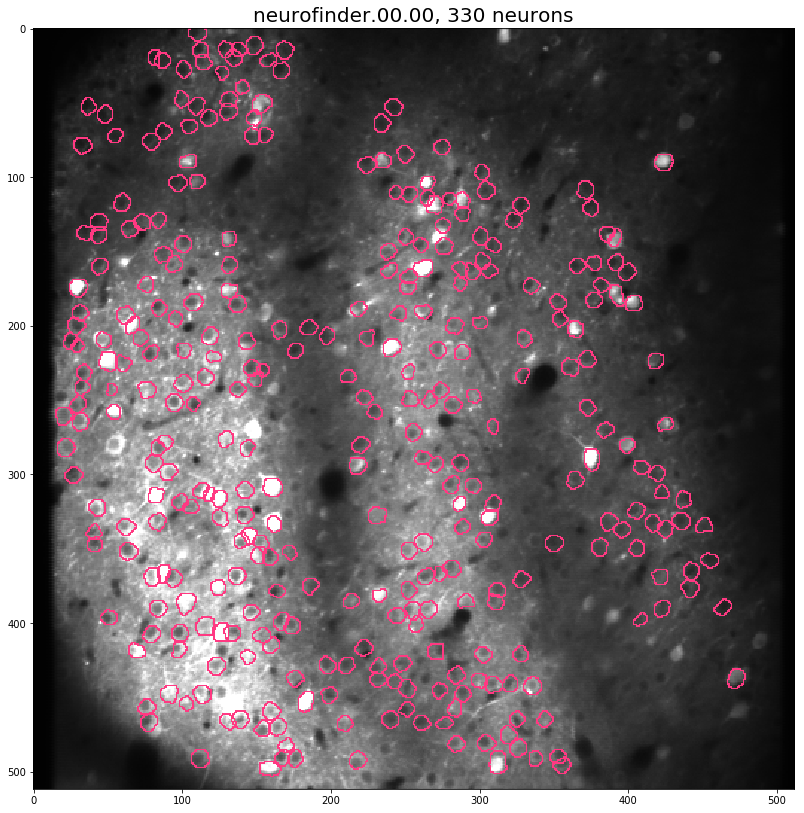

neurofinder.00.00.test


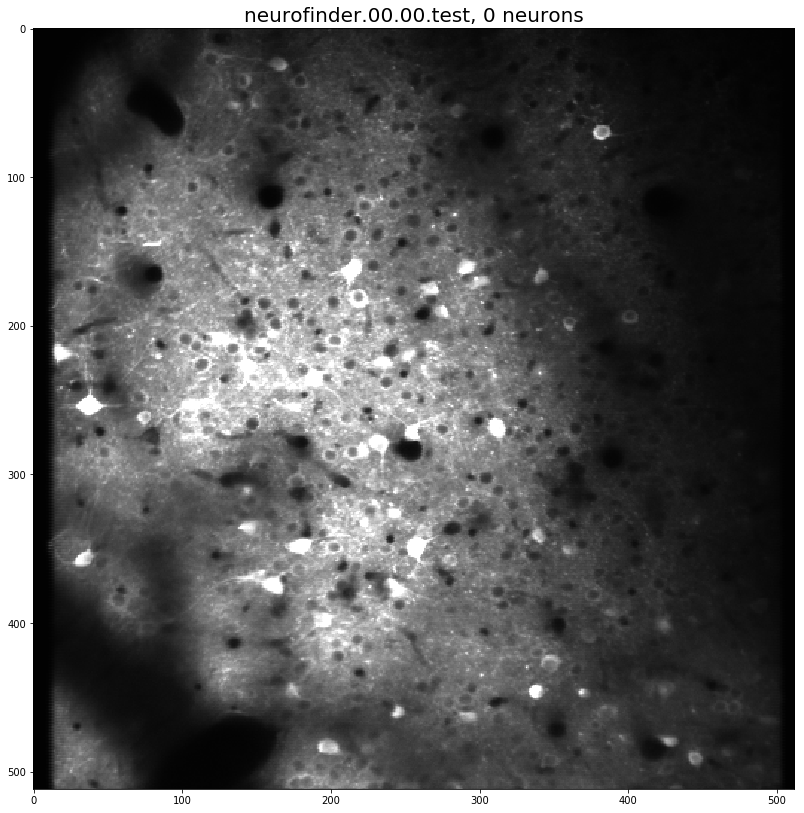

neurofinder.00.01


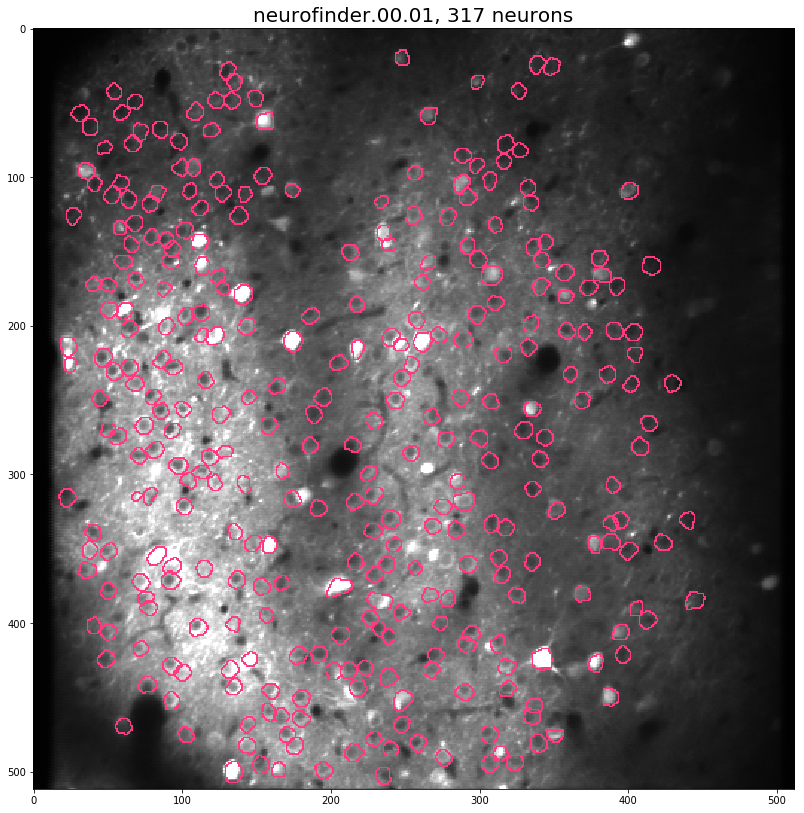

neurofinder.00.01.test


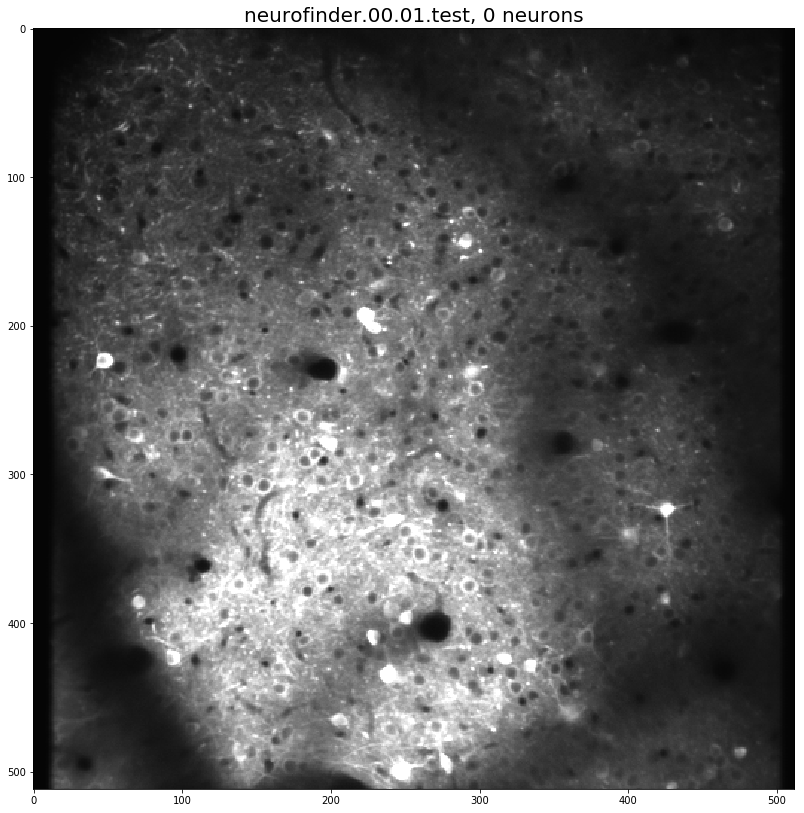

neurofinder.00.02


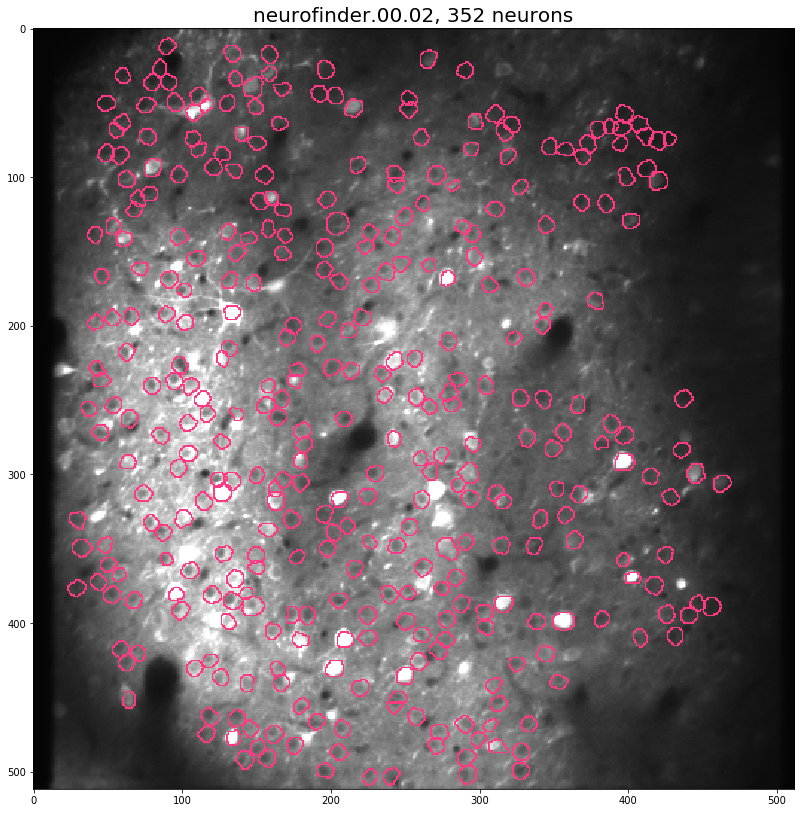

neurofinder.00.03


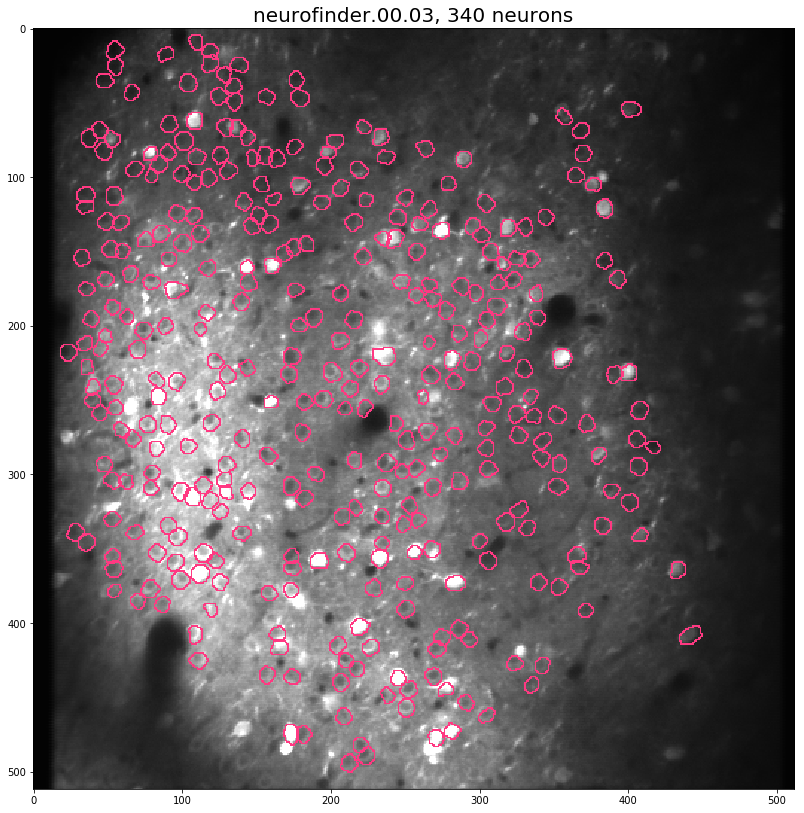

neurofinder.00.04


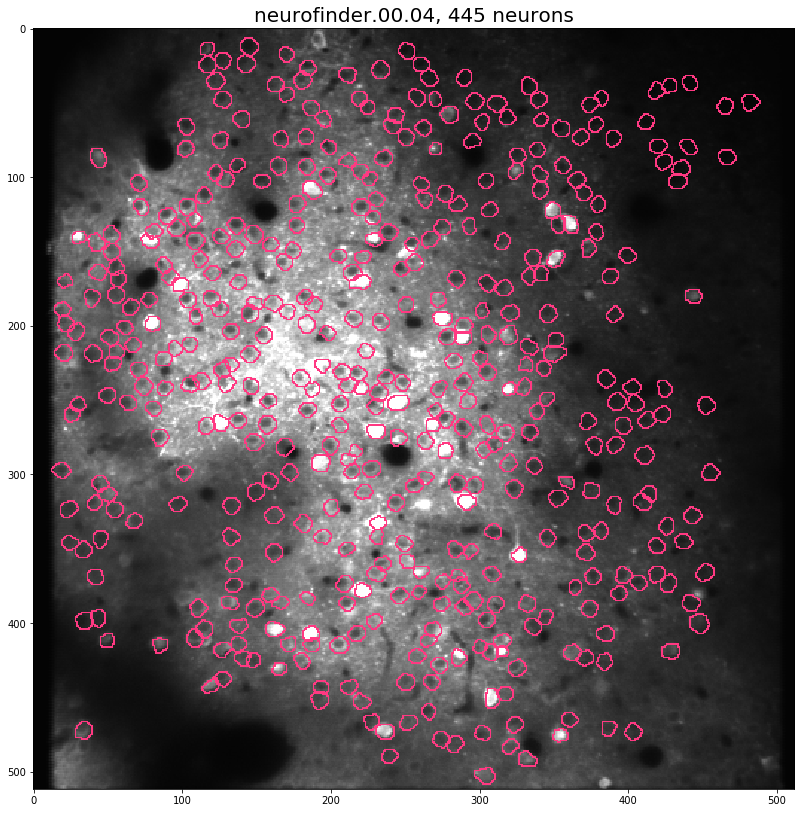

neurofinder.00.05


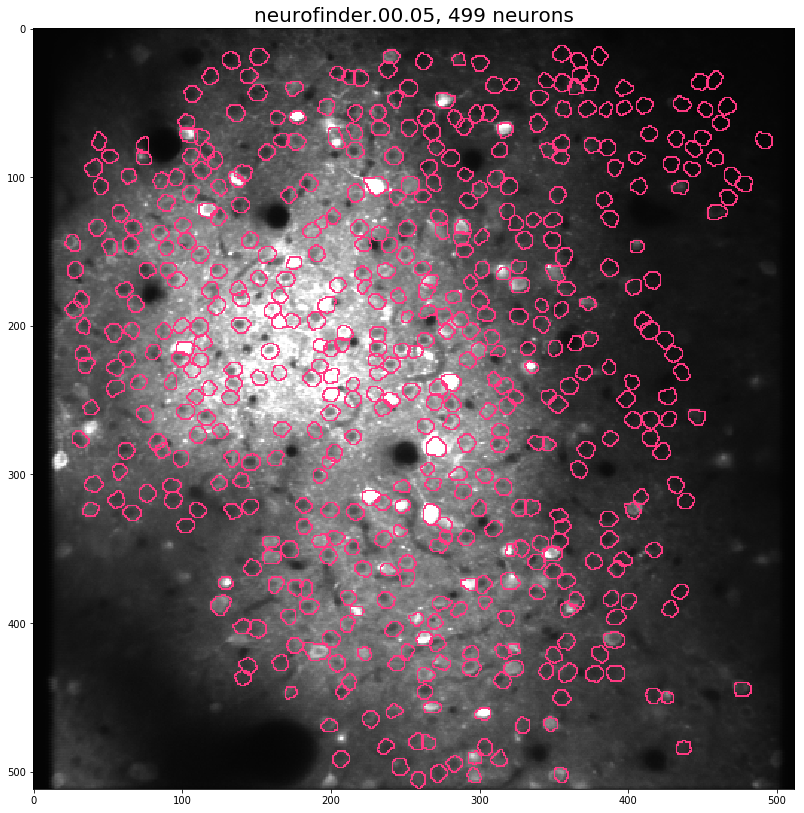

neurofinder.00.06


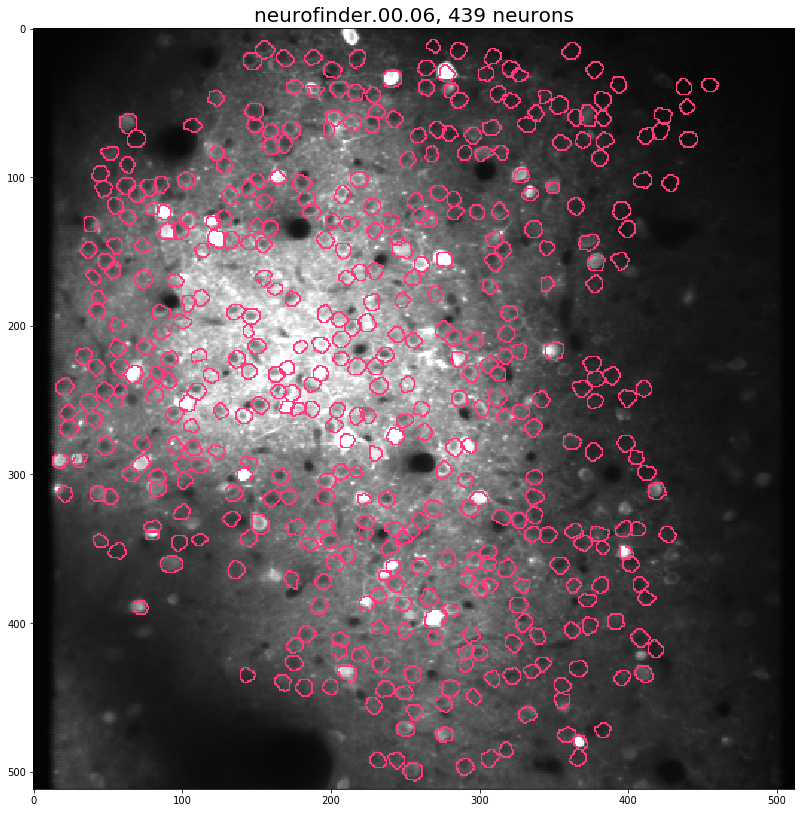

neurofinder.00.07


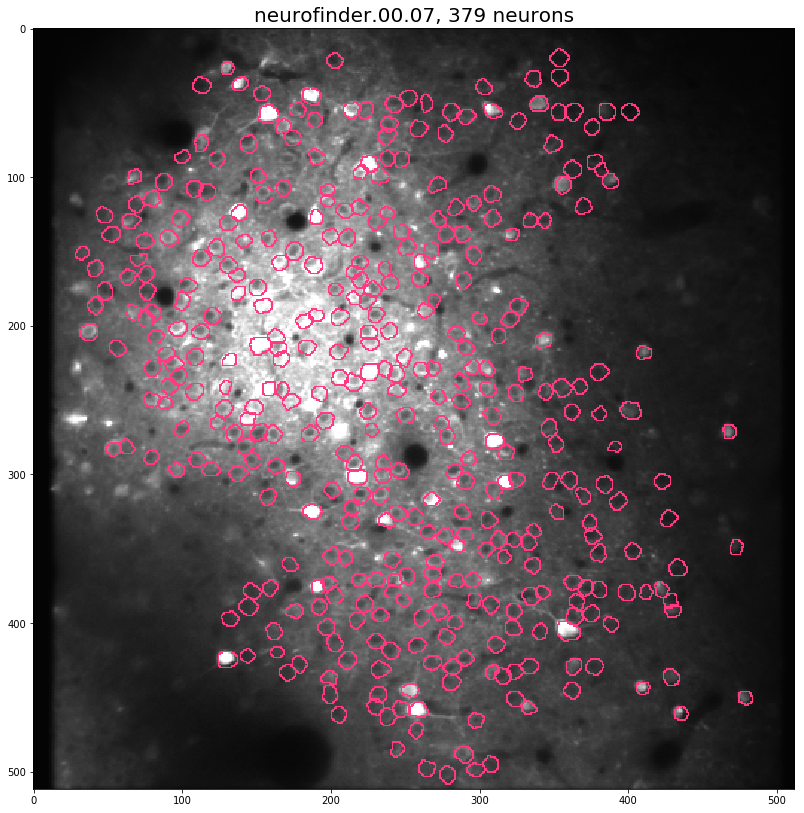

neurofinder.00.08


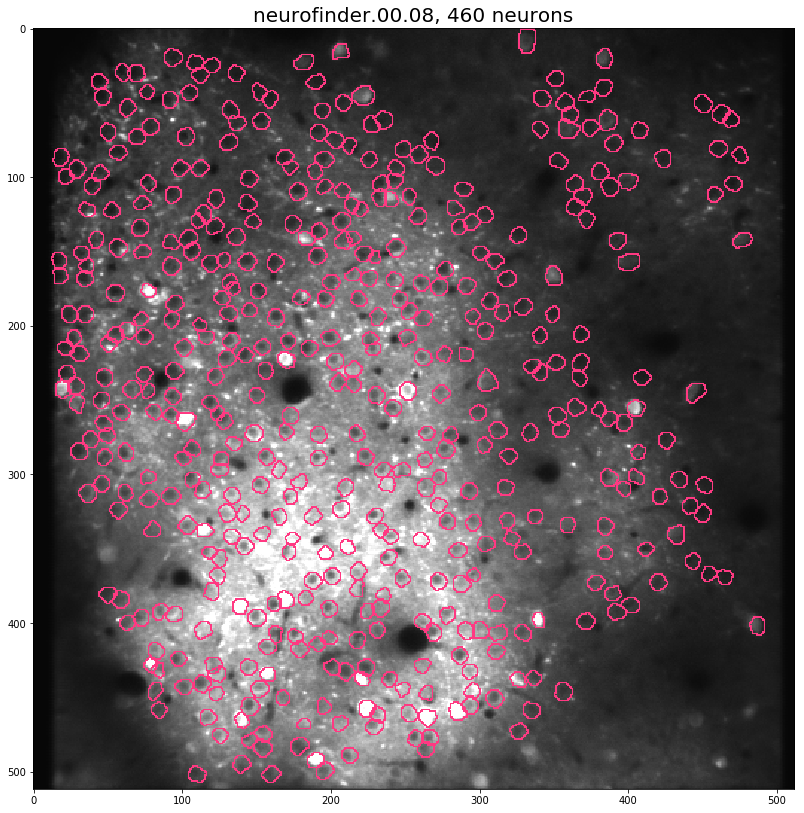

neurofinder.00.09


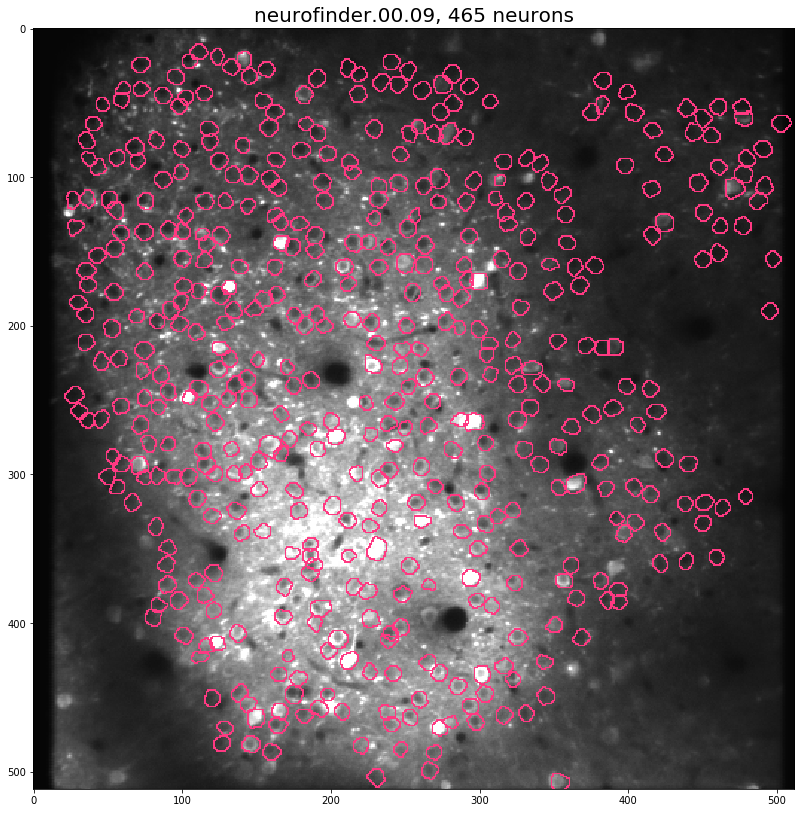

neurofinder.00.10


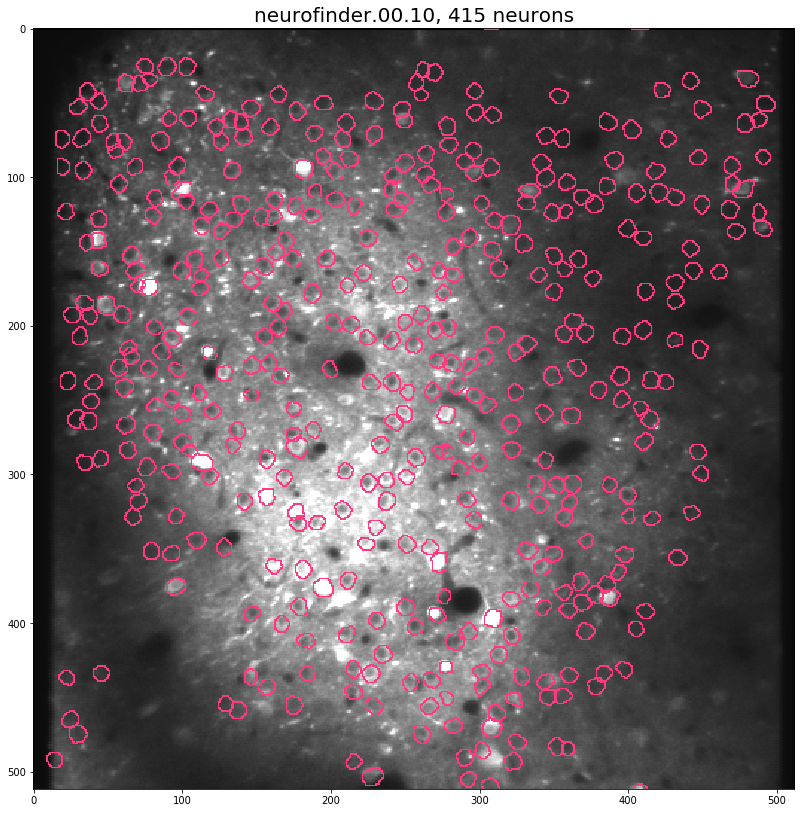

neurofinder.00.11


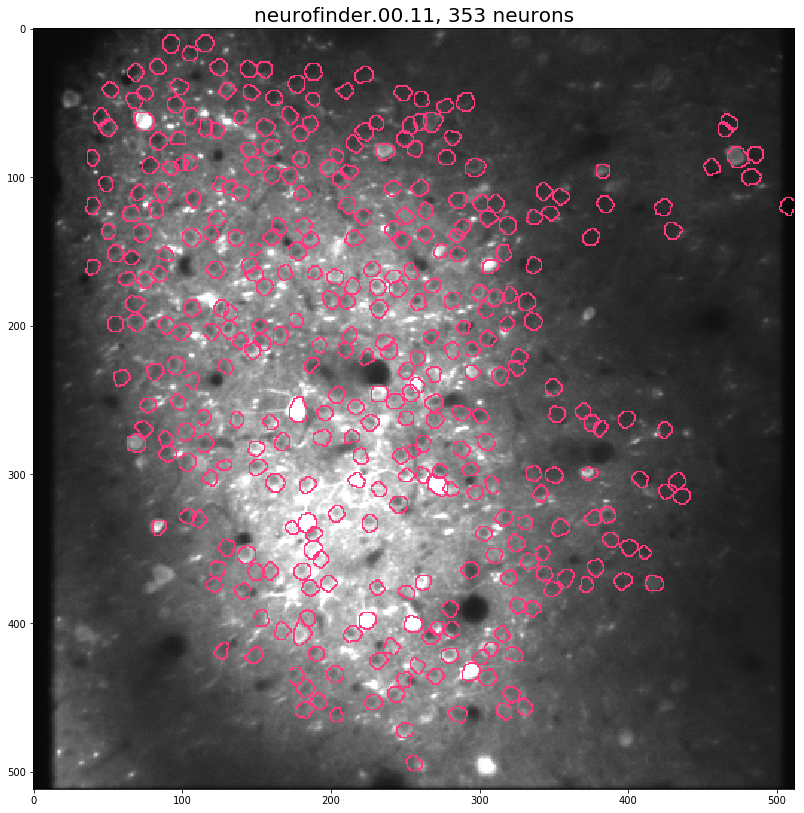

neurofinder.01.00


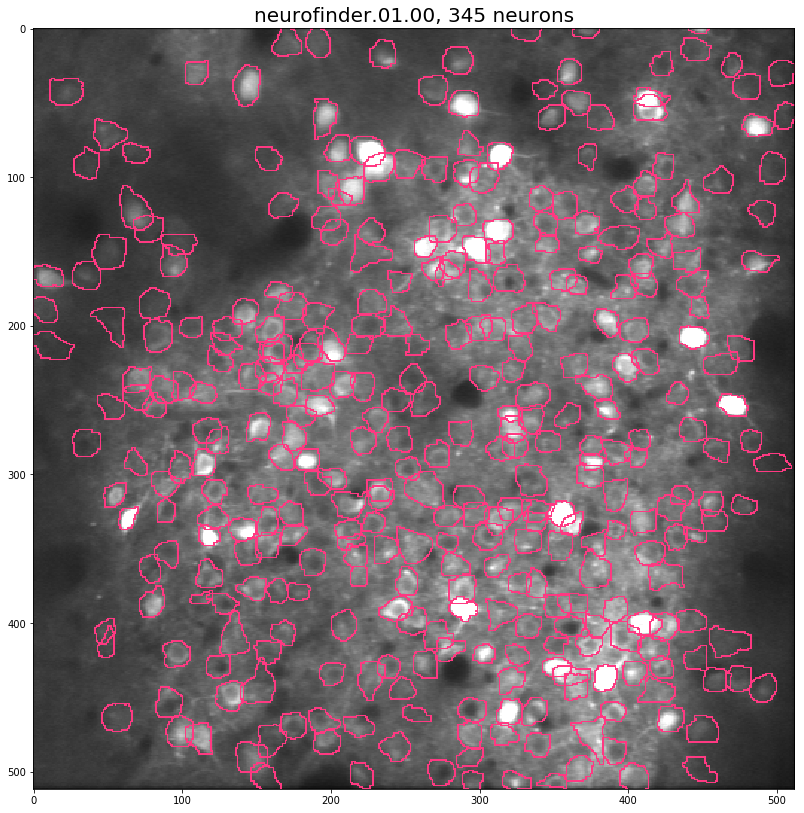

neurofinder.01.00.test


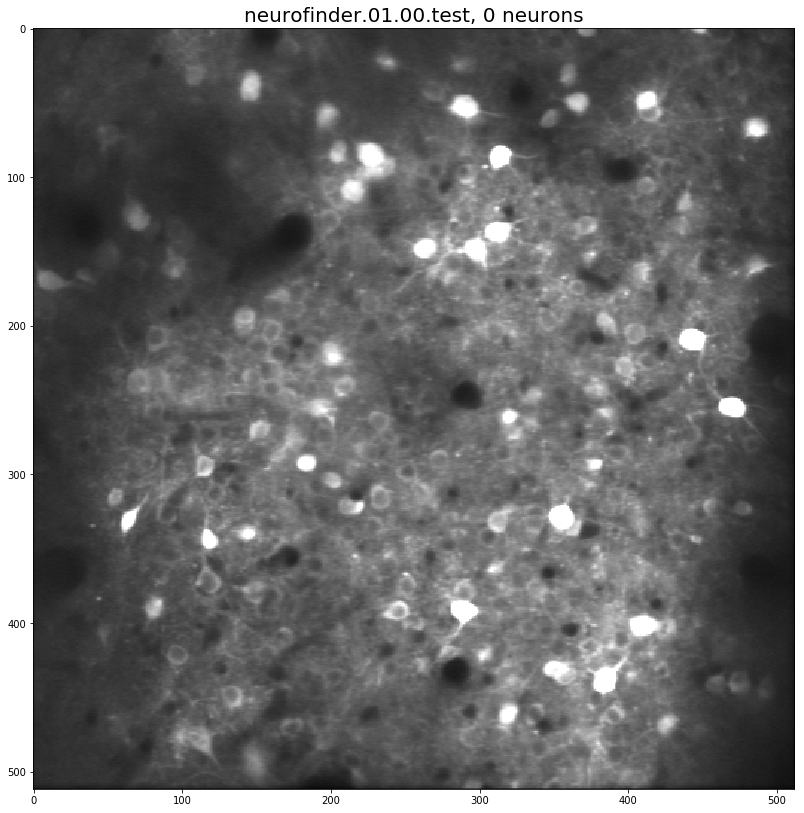

neurofinder.01.01


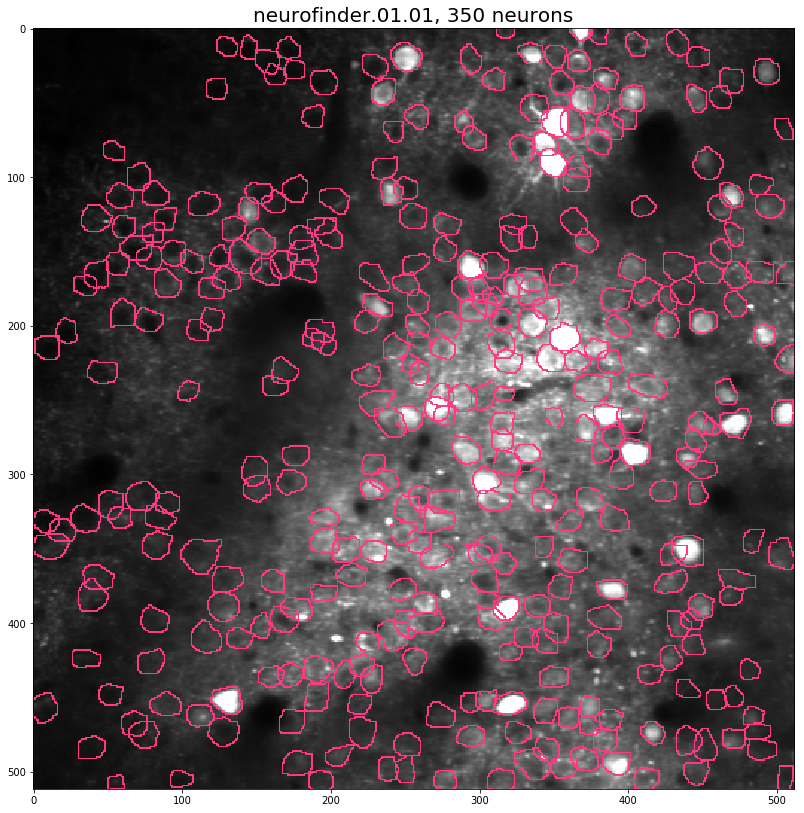

neurofinder.01.01.test


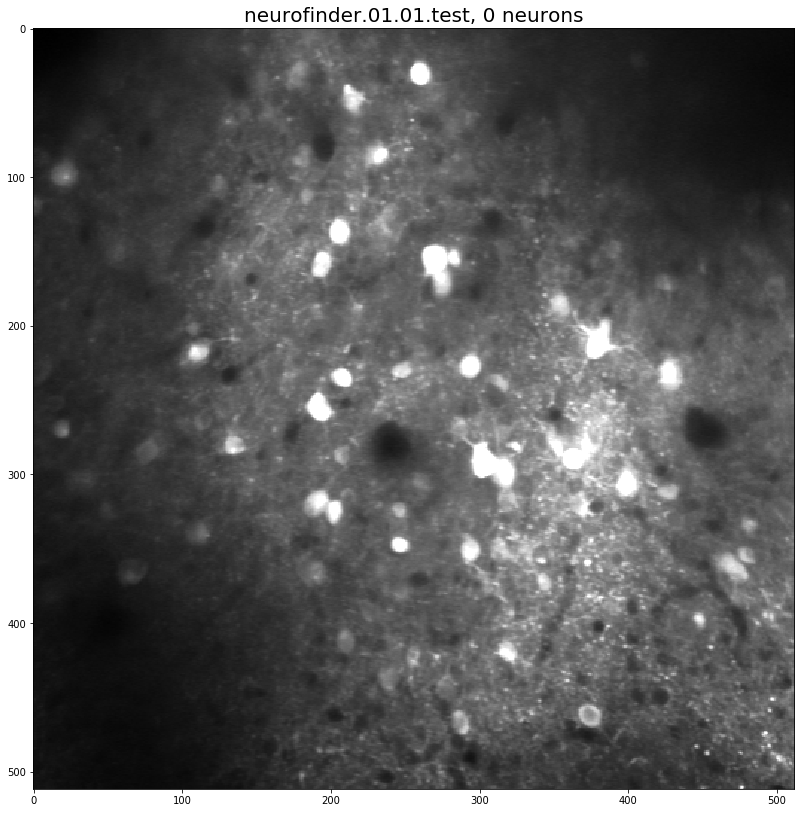

neurofinder.02.00


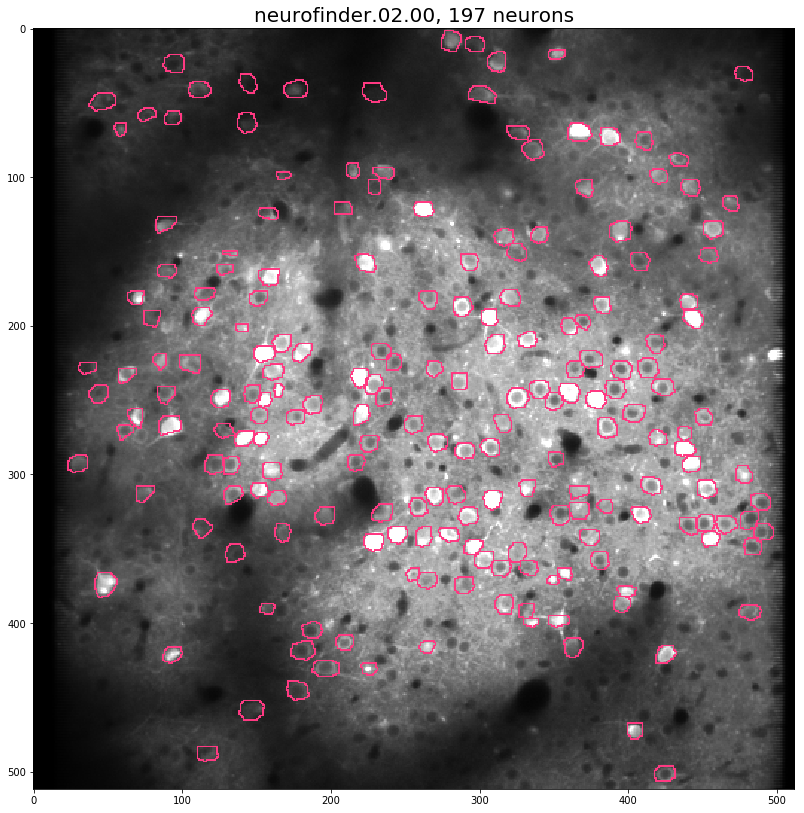

neurofinder.02.00.test


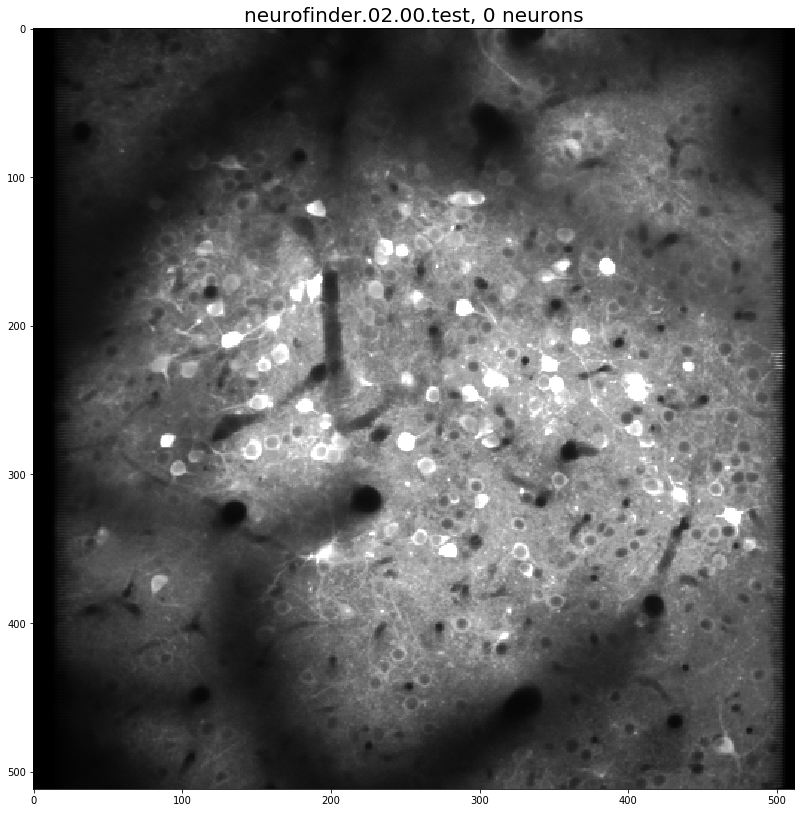

neurofinder.02.01


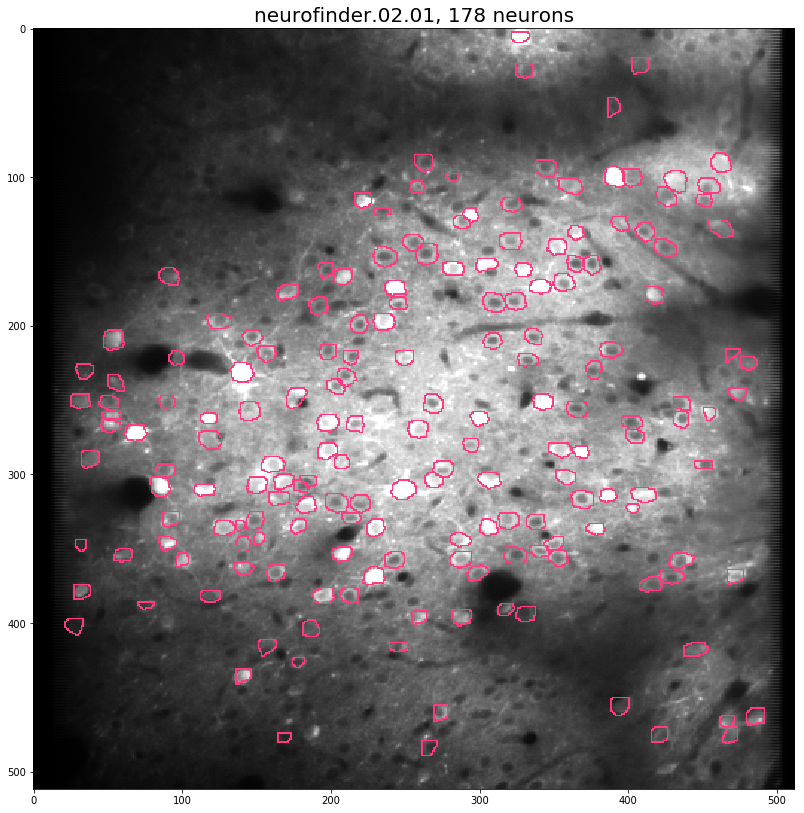

neurofinder.02.01.test


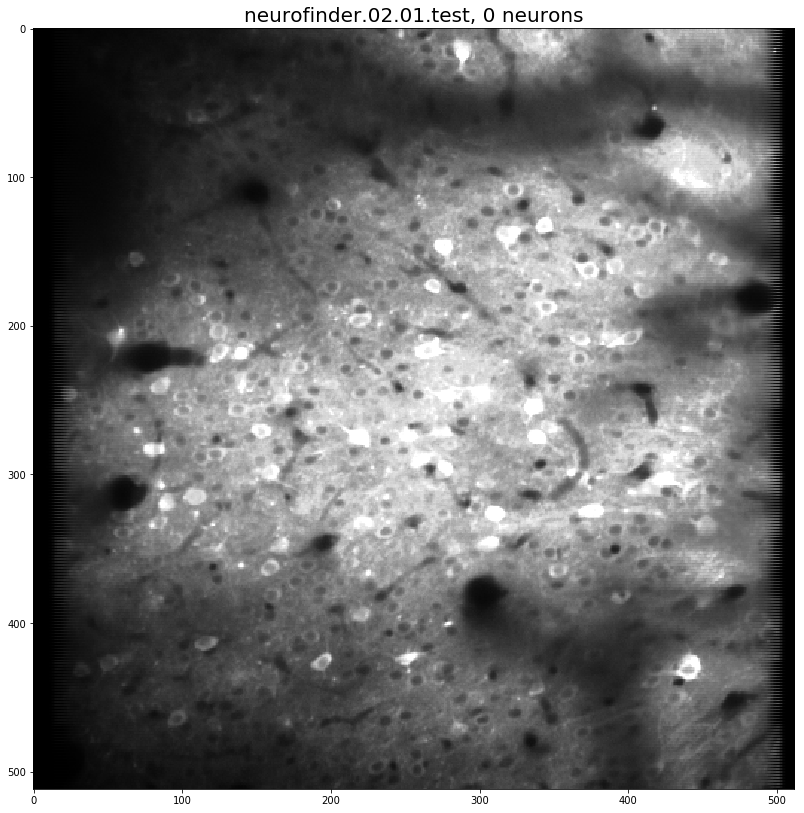

neurofinder.03.00


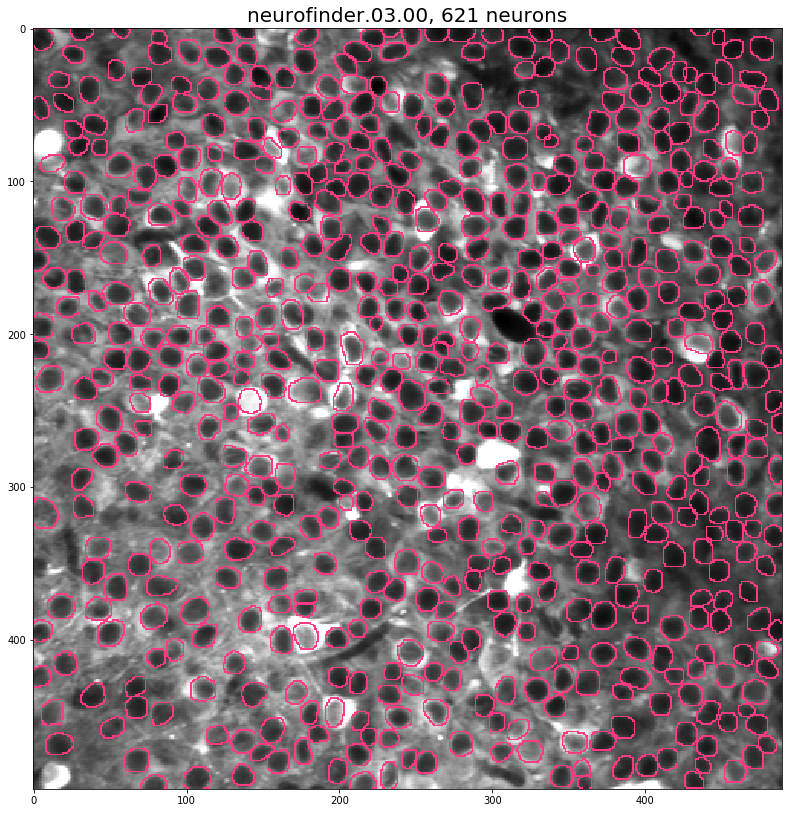

neurofinder.03.00.test


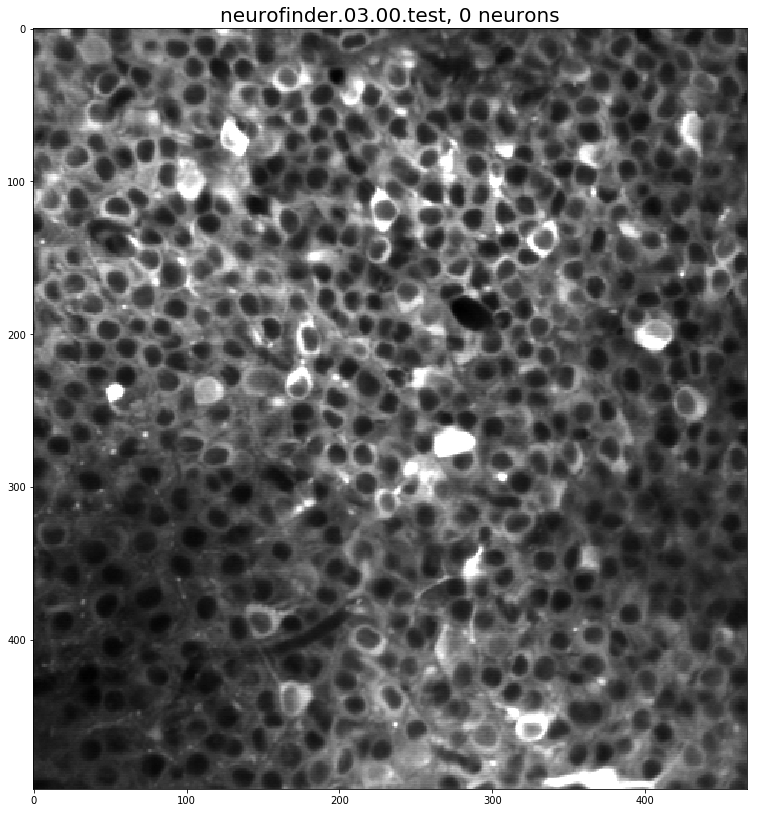

neurofinder.04.00


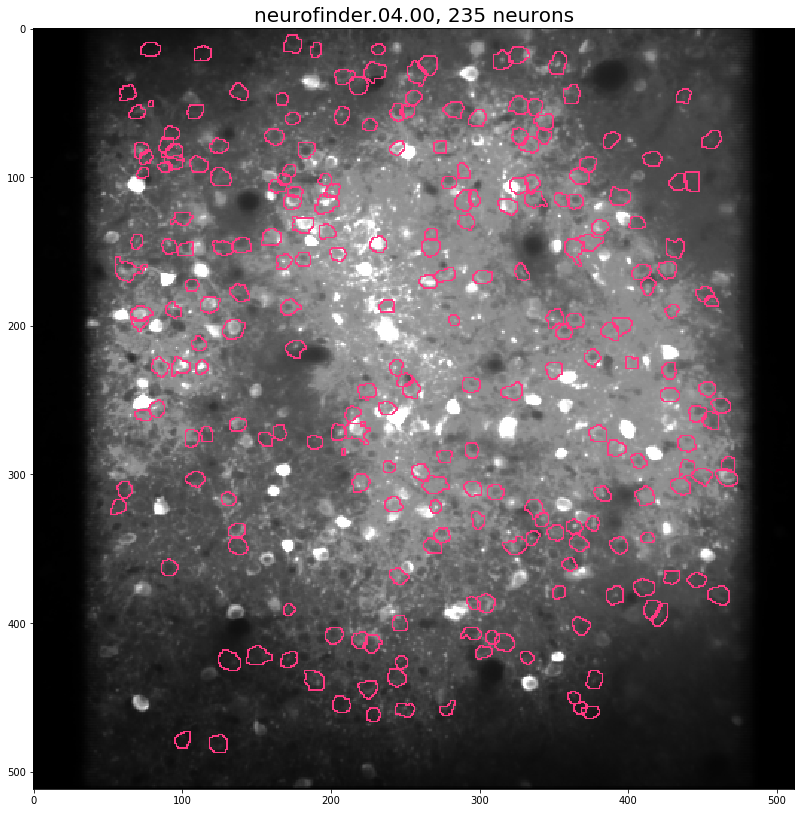

neurofinder.04.00.test


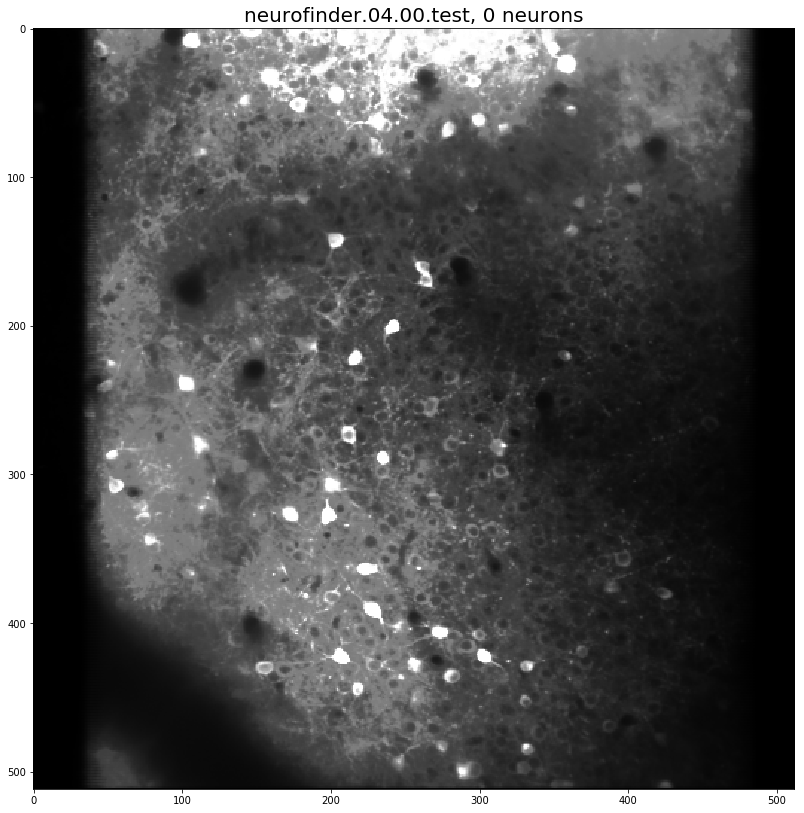

neurofinder.04.01


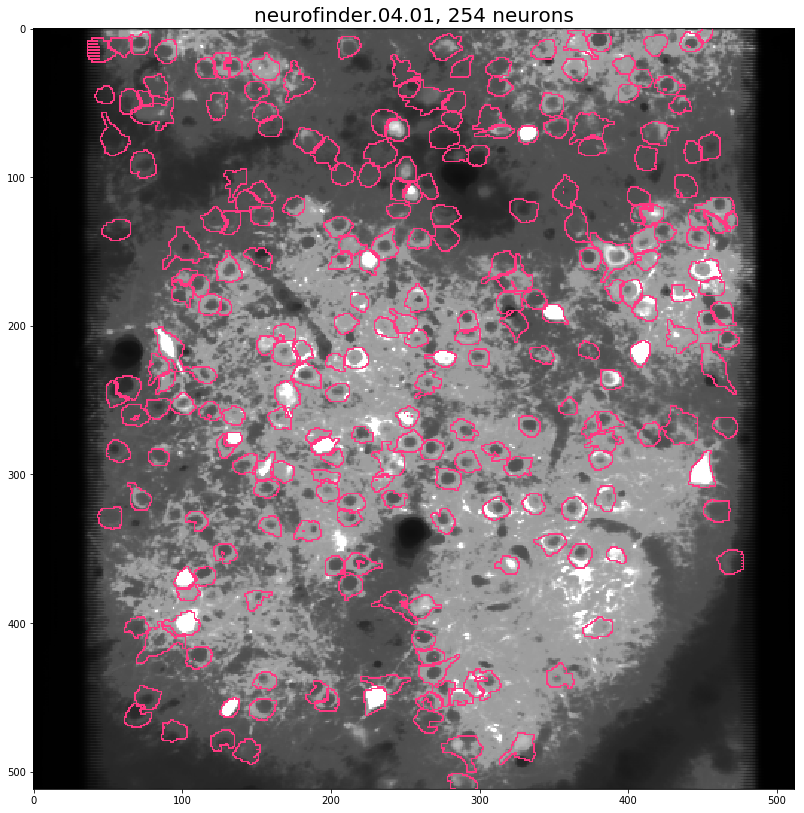

neurofinder.04.01.test


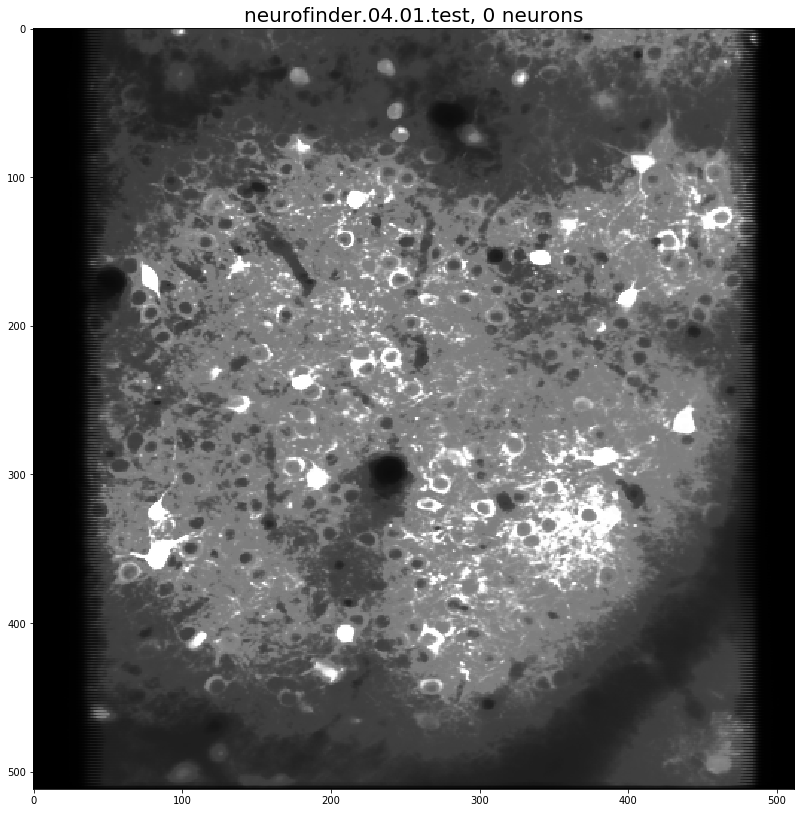

In [9]:
# 2. Neurofinder training datasets mean summary images plotted with neurons outlined.
# Corresponding test set images without neurons.
datasets = nf_load_hdf5('all', DATASETS_DIR)
for ds in datasets:
    print(ds.attrs['name']) # ctrl-F friendly.
    plt.figure(figsize=(14,14))
    if 'masks/raw' in ds:
        masks = ds.get('masks/raw')[...]
        colors = [(141,32,72)] * len(masks)
    else:
        masks, colors = [], []
        
    outlined = mask_outlines(ds.get('series/mean')[...], masks, colors)
    plt.title('%s, %d neurons' % (ds.attrs['name'], len(masks)), size='20')
    plt.imshow(outlined)
    plt.show()
    ds.close()

neurofinder.00.00.test


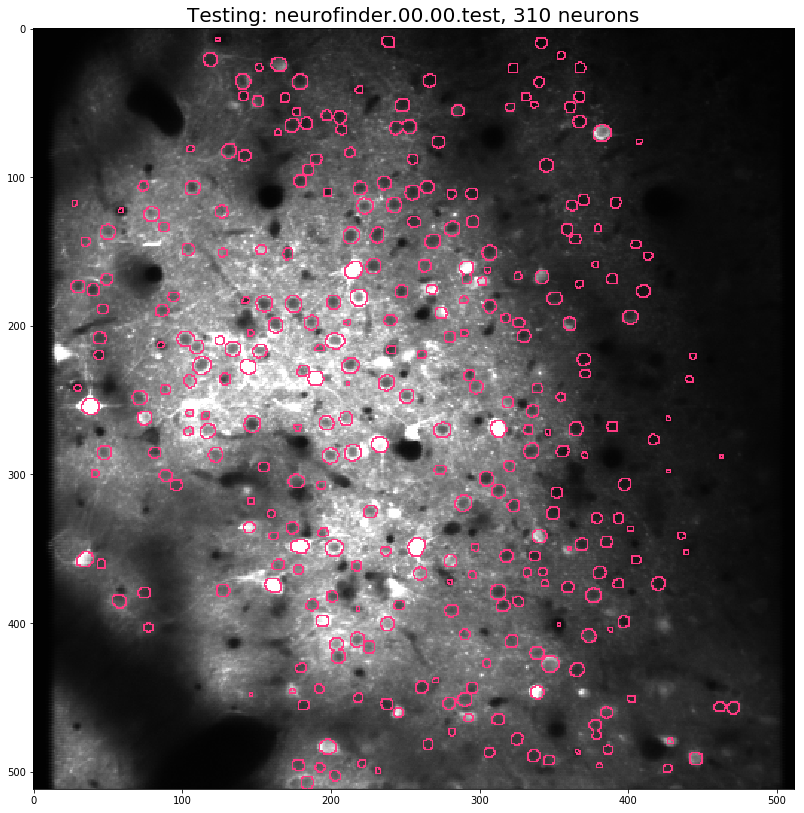

neurofinder.00.01.test


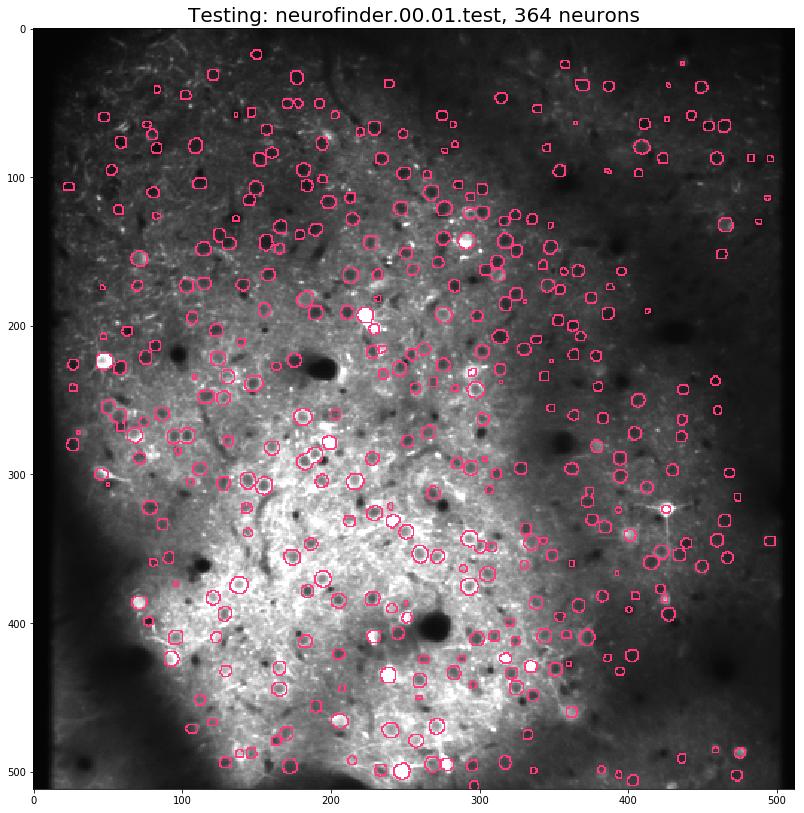

neurofinder.01.00.test


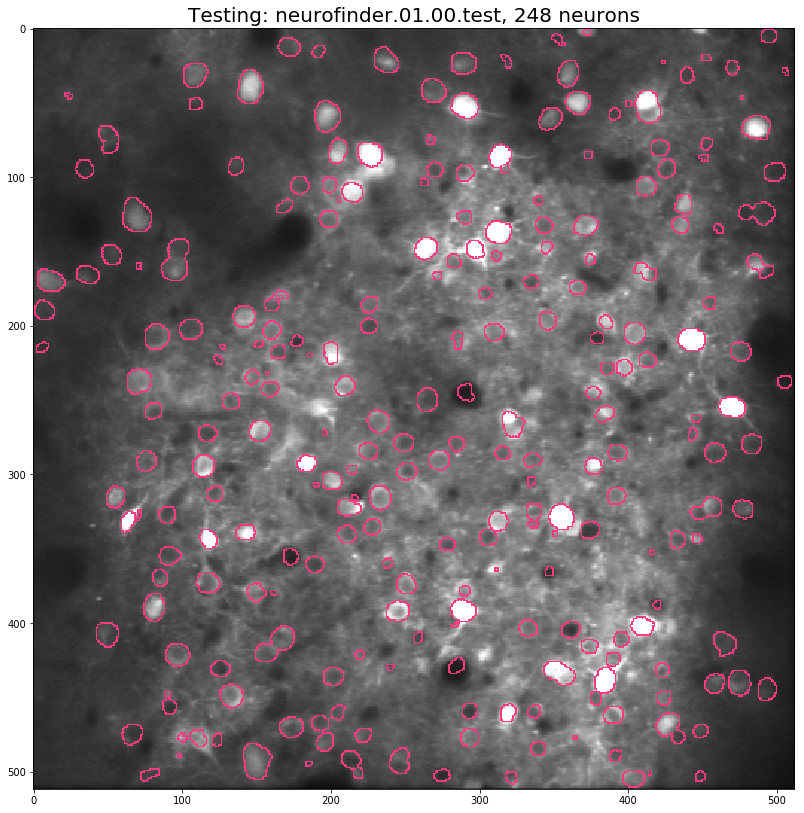

neurofinder.01.01.test


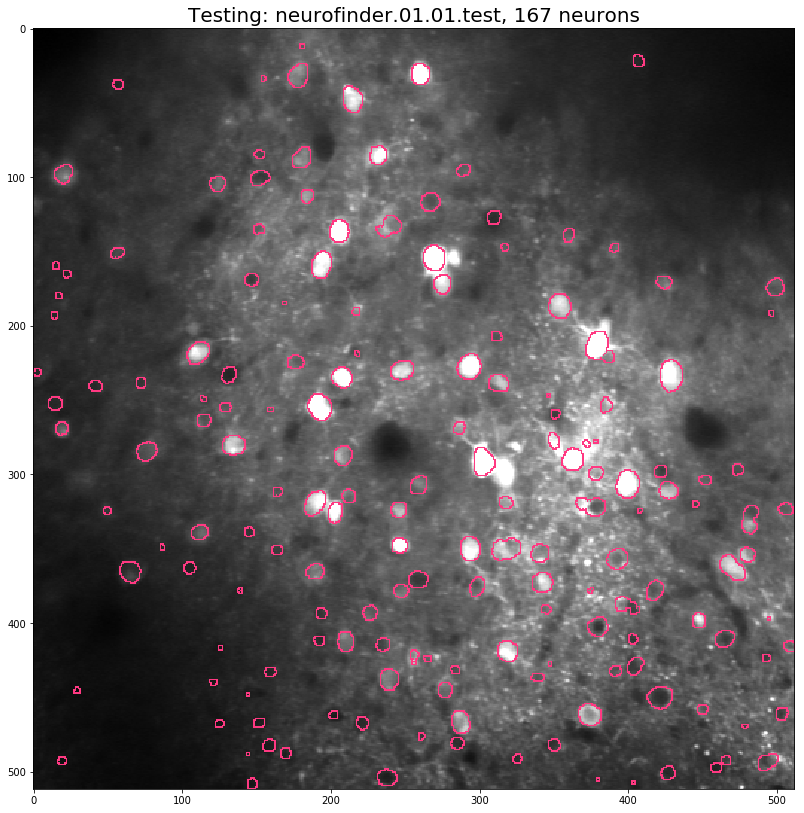

neurofinder.02.00.test


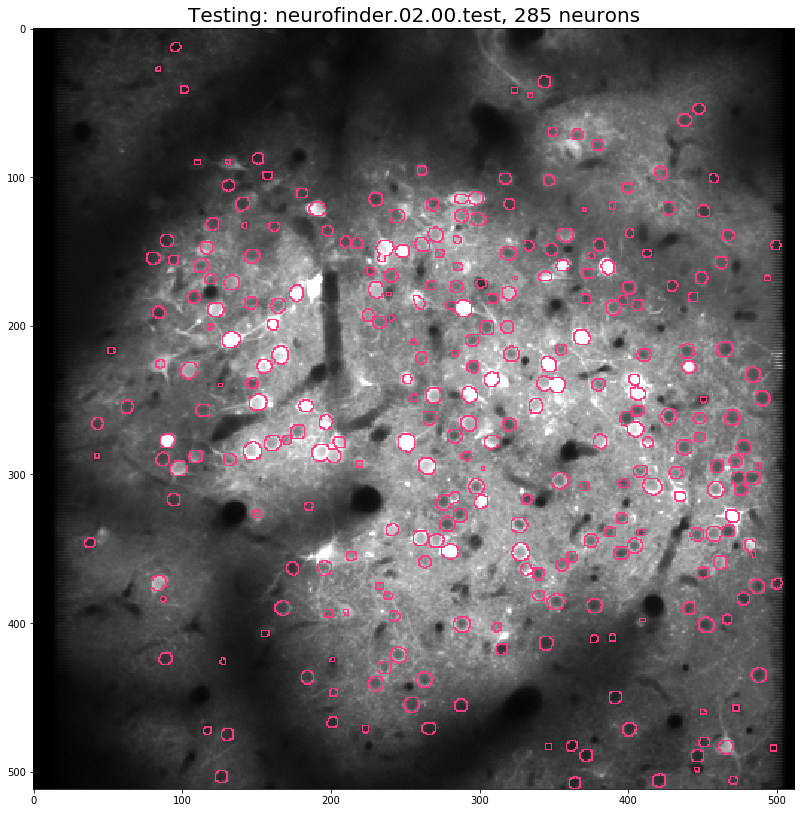

neurofinder.02.01.test


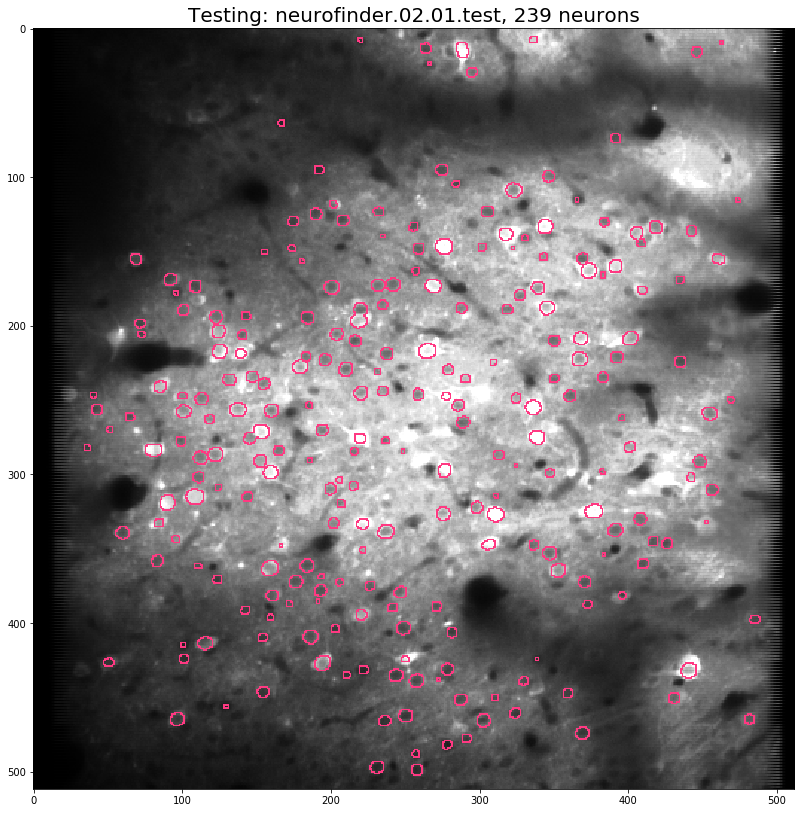

neurofinder.03.00.test


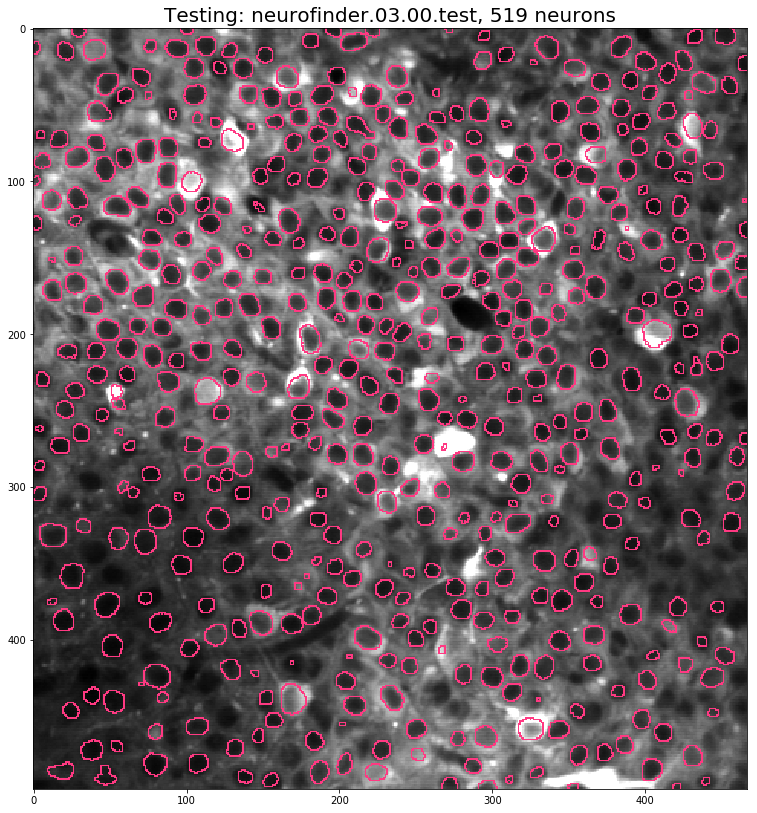

neurofinder.04.00.test


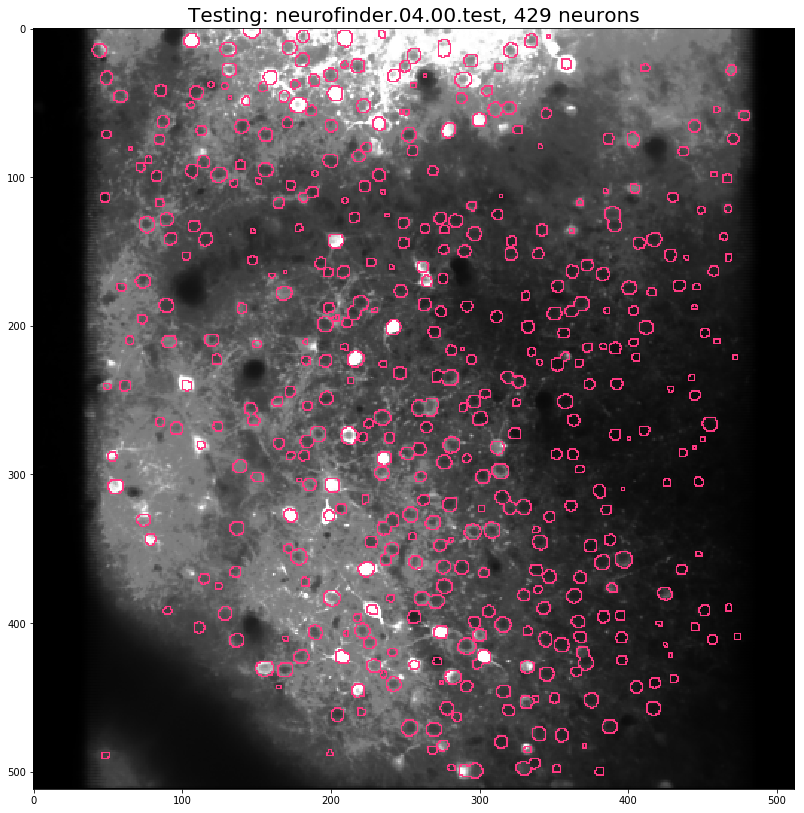

neurofinder.04.01.test


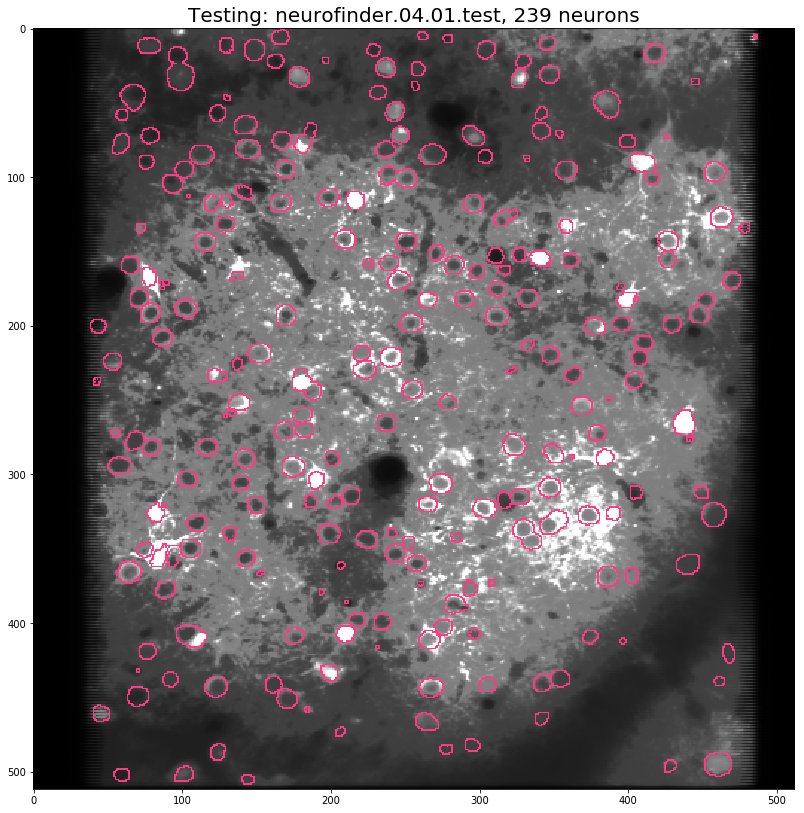

In [5]:
# 3. Neurofinder testing dataset submission mean summary images plotted with neurons outlined.
# Submission made on 6/16/17 scoring 0.5356 mean F1.
submission_path = '../checkpoints/unet_2d_summary_128x128_nf_0.53556/submission_latest.json'
submission = json.load(open(submission_path, 'r'))

names = ['neurofinder.%s' % x['dataset'] for x in submission]
datasets = nf_load_hdf5(names)

for ds, subm in zip(datasets, submission):
    regions = subm['regions']
    m = np.zeros((len(regions),) + ds.get('series/mean').shape, dtype=np.uint8)
    for i, r in enumerate(regions):
        yy = [y for y,x in r['coordinates']]
        xx = [x for y,x in r['coordinates']]
        m[i][yy, xx] = 1
    outlined = mask_outlines(ds.get('series/mean')[...], m, [(141,32,72)] * m.shape[0])
    
    print(ds.attrs['name'])
    plt.figure(figsize=(14,14))
    plt.title('Testing: %s, %d neurons' % (ds.attrs['name'], m.shape[0]), size='20')
    plt.imshow(outlined.astype('float32'))
    plt.show()
    ds.close()

sj.010517


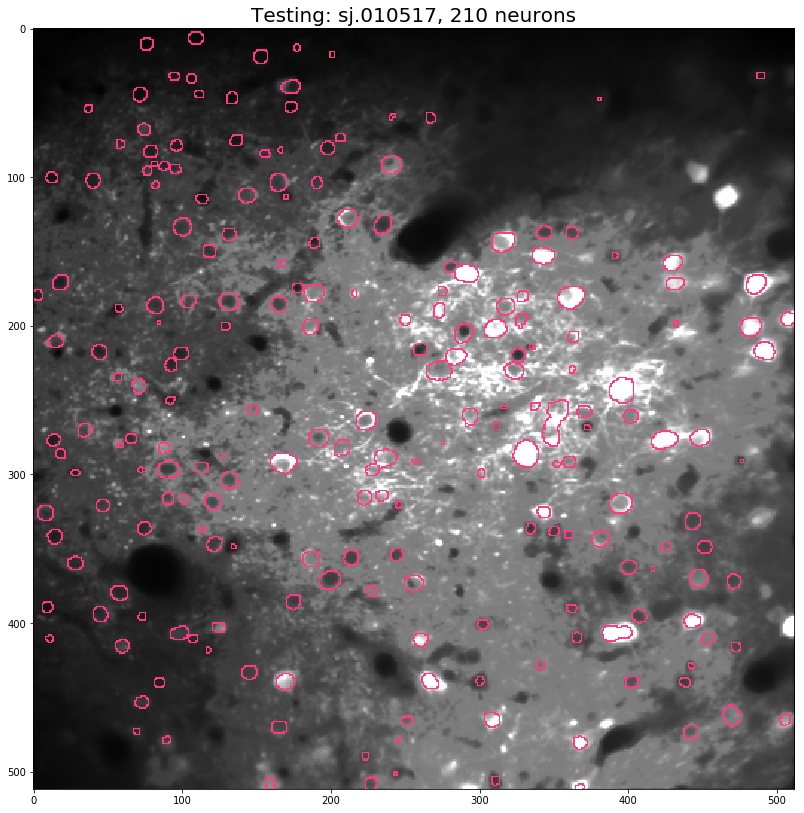

sj.010617


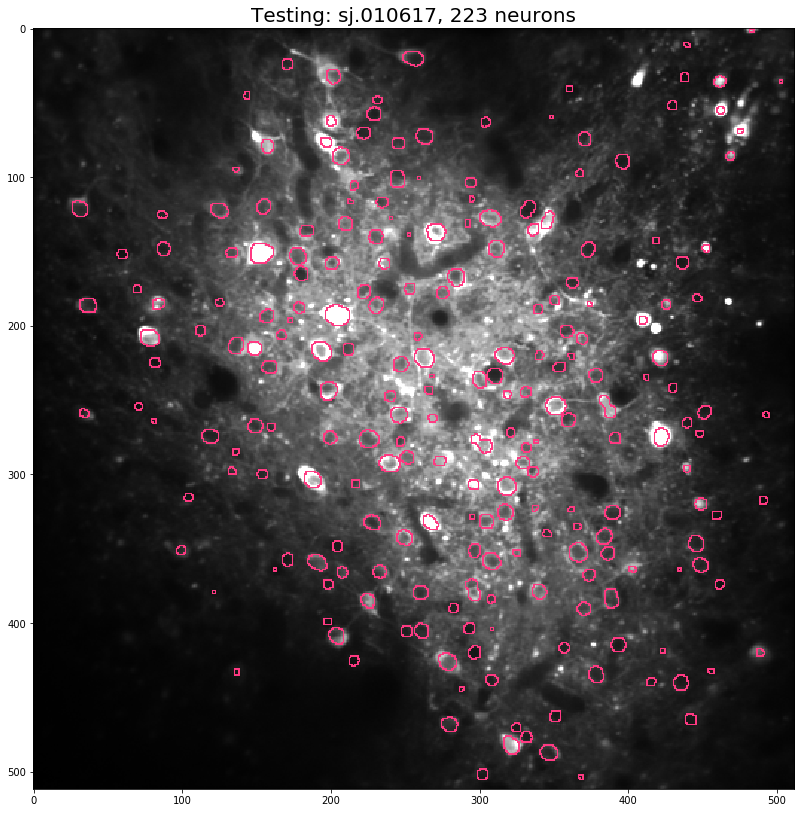

sj.111216


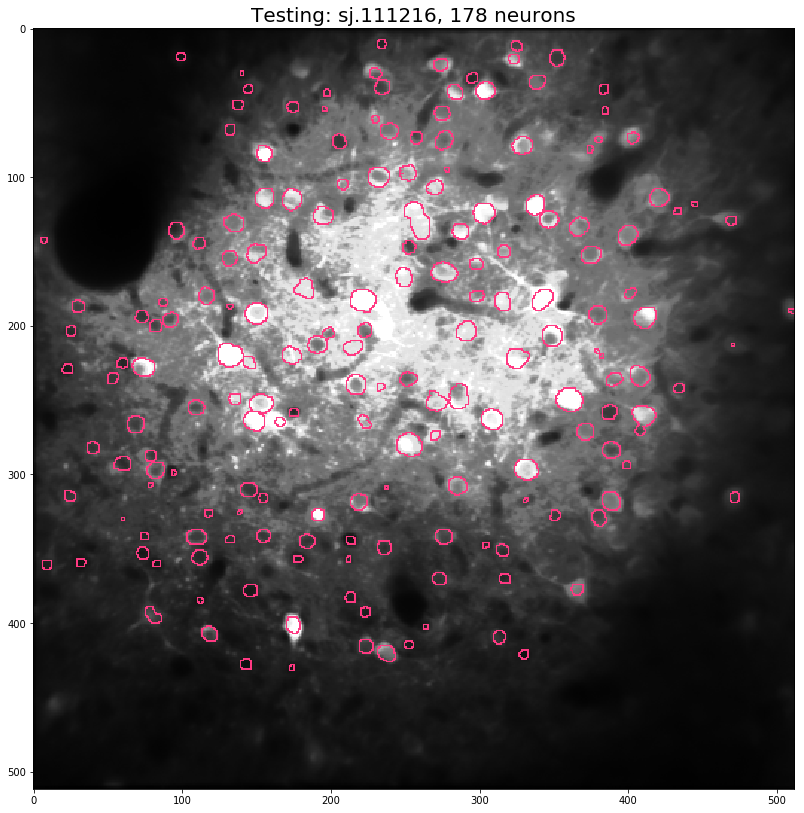

In [4]:
# 4. Our own dataset mean summary images plotted with *predicted* neurons outlined.
# Neuron predictions made using the model trained on Neurofinder data.
from os import environ
environ['CUDA_VISIBLE_DEVICES'] = "2"
from deepcalcium.models.neurons.unet_2d_summary import UNet2DSummary

dsfiles = ['../data/sj.010517/dataset.hdf5', '../data/sj.010617/dataset.hdf5', '../data/sj.111216/dataset.hdf5']
datasets = [h5py.File(dsf, 'r') for dsf in dsfiles]
model = UNet2DSummary(cpdir='%s/tmp' % expanduser('~'))
wpath = '../checkpoints/unet_2d_summary_128x128_nf_0.53556/weights_val_nf_f1_mean.hdf5'
Mp = model.predict(datasets, weights_path=wpath, save=False)

for ds, mp in zip(datasets, Mp):
    print(ds.attrs['name'])
    s = ds.get('series/mean')[...]
    outlined = mask_outlines(s, [mp], [(141,32,72)])
    nb_neurons = np.max(measure.label(mp)) - 1
    plt.figure(figsize=(14,14))
    plt.title('Testing: %s, %d neurons' % (ds.attrs['name'], nb_neurons), size='20')
    plt.imshow(outlined.astype('float32'))
    plt.show()
    ds.close()